In [1]:
from astropy.io import fits
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as pa
from scipy.io import readsav
from math import sqrt, pi
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

In [2]:
import glob

In [48]:
keckt_folder = glob.glob('/g/lu/data/keck_telemetry/*')
keckt_folder = [keckt_folder[i].split('/')[5][0:8] for i in range(len(keckt_folder))]
keckt_folder

['20170718',
 '93d38ad3',
 '20130426',
 '20130427',
 '20140319',
 '20140320',
 '20140418',
 '20140419',
 '20140511',
 '20140519',
 '20140703',
 '20140704',
 '20140804',
 '20140806',
 '20150331',
 '20150401',
 '20150402',
 '20150514',
 '20150809',
 '20150810',
 '20150811',
 '20160503',
 '20160517',
 '20170504',
 '20170505',
 '20170727',
 '20170808',
 '20170809',
 '20170810',
 '20170811',
 '20170823',
 '20170824',
 '20170826',
 'k1']

In [61]:
keck_folder = glob.glob('/g/lu/data/KECK/*')
keck_folder = [keck_folder[i].split('/')[5].split('_')[0] for i in range(len(keck_folder))]
i = 0
while i < len(keck_folder):
    if "jul" in keck_folder[i]:
        a = keck_folder[i].replace('jul', '07')
        keck_folder[i] = a
    elif 'jun' in keck_folder[i]:
        a = keck_folder[i].replace('jun', '06')
        keck_folder[i] = a
    elif 'aug' in keck_folder[i]:
        a =  keck_folder[i].replace('aug', '08')
        keck_folder[i] = a
    elif 'oct' in keck_folder[i]:
        a =  keck_folder[i].replace('oct', '10')
        keck_folder[i] = a
    elif 'nov' in keck_folder[i]:
        a = keck_folder[i].replace('nov', '11')
        keck_folder[i] = a
    elif 'may' in keck_folder[i]:
        a = keck_folder[i].replace('may', '05')
        keck_folder[i] = a
    elif 'sep' in keck_folder[i]:
        a = keck_folder[i].replace('sep', '09')
        keck_folder[i] = a
    i += 1
keck_folder

['20050729',
 '20080607',
 '20090724',
 '20090610',
 '20090616',
 '20090627',
 '20090909',
 '20100814',
 '20100830',
 '20100703',
 '20100604',
 '20110524',
 '20110627',
 '20110707',
 '20110831',
 '20110707',
 '20110525',
 '20111115',
 '20111024',
 '20120127',
 '20120523',
 '20120623',
 '20120710',
 '20120705',
 '20130430',
 '20130715',
 '20130803',
 '20130808',
 '20131229',
 '20141211',
 '20150402',
 '20150409',
 '20150505',
 '20150505',
 '20150531',
 '20150607',
 '20150628',
 '20150723',
 '20160417',
 '20160503',
 '20160524',
 '20160628',
 '20160714',
 '20160728',
 '20160802',
 'osiris',
 'tmp.fits',
 'download',
 '20170521',
 '20170605',
 '20170608',
 '20170719',
 '20170714',
 '20180511',
 '20180622',
 '20180802',
 '20180816',
 '20180821',
 '20161010',
 '20190417',
 '20190421',
 '20190513',
 '20190513']

In [62]:
for i in keckt_folder:
    if i in keck_folder:
        print(i)

20150402
20160503


In [3]:
file_LGS = "/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/*/*sav"
files_lgs = glob.glob(file_LGS)

In [4]:
files_lgs

['/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0042_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0043_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0044_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0045_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0046_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0047_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0048_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0049_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0050_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0051_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0052_fullNGS_trs.sav',
 '/../g/lu/data/keck_

In [5]:
tele_time_sync = {'n0042_fullNGS_trs.sav': '05:06:26.887',
 'n0043_fullNGS_trs.sav': '05:07:09.08',
 'n0044_fullNGS_trs.sav': '05:07:41.060',
 'n0045_fullNGS_trs.sav': '05:09:01.244',
 'n0046_fullNGS_trs.sav': '05:09:49.666',
 'n0047_fullNGS_trs.sav': '05:10:39.813',
 'n0048_fullNGS_trs.sav': '05:12:24.621',
 'n0049_fullNGS_trs.sav': '05:13:16.546',
 'n0050_fullNGS_trs.sav': '05:14:08.325',
 'n0051_fullNGS_trs.sav': '05:15:51.612',
 'n0052_fullNGS_trs.sav': '05:16:34.880',
 'n0053_fullNGS_trs.sav': '05:17:16.952',
 'n0054_fullNGS_trs.sav': '05:18:35.425',
 'n0055_fullNGS_trs.sav': '05:19:20.642',
 'n0056_fullNGS_trs.sav': '05:20:05.182',
 'n0057_fullNGS_trs.sav': '05:21:27.750',
 'n0058_fullNGS_trs.sav': '05:22:02.897',
 'n0059_fullNGS_trs.sav': '05:22:32.507',
 'n0060_fullNGS_trs.sav': '05:23:45.506',
 'n0061_fullNGS_trs.sav': '05:24:25.695',
 'n0062_fullNGS_trs.sav': '05:24:57.060',
 'n0063_fullNGS_trs.sav': '05:29:27.521',
 'n0064_fullNGS_trs.sav': '05:29:48.076',
 'n0065_fullNGS_trs.sav': '05:30:10.213',
 'n0066_fullNGS_trs.sav': '05:31:21.806',
 'n0067_fullNGS_trs.sav': '05:31:52.632',
 'n0068_fullNGS_trs.sav': '05:32:25.487',
 'n0069_fullNGS_trs.sav': '05:33:32.295',
 'n0070_fullNGS_trs.sav': '05:34:04.336',
 'n0071_fullNGS_trs.sav': '05:34:37.368',
 'n0072_fullNGS_trs.sav': '05:36:02.306',
 'n0073_fullNGS_trs.sav': '05:36:23.658',
 'n0074_fullNGS_trs.sav': '05:36:43.835',
 'n0075_fullNGS_trs.sav': '05:37:58.410',
 'n0076_fullNGS_trs.sav': '05:38:19.384',
 'n0077_fullNGS_trs.sav': '05:38:42.824',
 'n0078_fullNGS_trs.sav': '05:39:50.477',
 'n0079_fullNGS_trs.sav': '05:40:12.431',
 'n0080_fullNGS_trs.sav': '05:40:35.520',
 'n0081_fullNGS_trs.sav': '05:41:45.209',
 'n0082_fullNGS_trs.sav': '05:42:04.284',
 'n0083_fullNGS_trs.sav': '05:42:24.517',
 'n0084_fullNGS_trs.sav': '05:47:28.422',
 'n0085_fullNGS_trs.sav': '05:47:59.655',
 'n0086_fullNGS_trs.sav': '05:48:34.516',
 'n0087_fullNGS_trs.sav': '05:50:01.244',
 'n0088_fullNGS_trs.sav': '05:50:58.597',
 'n0089_fullNGS_trs.sav': '05:51:49.456',
 'n0090_fullNGS_trs.sav': '05:53:34.859',
 'n0091_fullNGS_trs.sav': '05:54:33.521',
 'n0092_fullNGS_trs.sav': '05:55:24.311',
 'n0093_fullNGS_trs.sav': '05:57:00.944',
 'n0094_fullNGS_trs.sav': '05:57:46.205',
 'n0095_fullNGS_trs.sav': '05:58:33.861',
 'n0096_fullNGS_trs.sav': '05:59:59.444',
 'n0097_fullNGS_trs.sav': '06:00:40.344',
 'n0098_fullNGS_trs.sav': '06:01:22.387',
 'n0099_fullNGS_trs.sav': '06:04:28.796',
 'n0100_fullNGS_trs.sav': '06:05:11.479',
 'n0101_fullNGS_trs.sav': '06:05:54.430',
 'n0102_fullNGS_trs.sav': '06:06:18.886',
 'n0103_fullNGS_trs.sav': '06:06:49.229',
 'n0104_fullNGS_trs.sav': '06:07:17.376',
 'n0105_fullNGS_trs.sav': '06:08:15.994',
 'n0106_fullNGS_trs.sav': '06:08:48.684',
 'n0107_fullNGS_trs.sav': '06:09:04.597',
 'n0108_fullNGS_trs.sav': '06:10:02.497',
 'n0109_fullNGS_trs.sav': '06:10:35.403',
 'n0110_fullNGS_trs.sav': '06:10:51.179',
 'n0111_fullNGS_trs.sav': '06:12:08.107',
 'n0112_fullNGS_trs.sav': '06:12:50.820',
 'n0113_fullNGS_trs.sav': '06:13:21.233',
 'n0114_fullNGS_trs.sav': '06:14:38.709',
 'n0115_fullNGS_trs.sav': '06:14:54.492',
 'n0116_fullNGS_trs.sav': '06:15:10.287',
 'n0117_fullNGS_trs.sav': '06:17:15.117',
 'n0118_fullNGS_trs.sav': '06:17:30.940',
 'n0119_fullNGS_trs.sav': '06:17:46.782',
 'n0127_fullNGS_trs.sav': '06:25:51.677',
 'n0128_fullNGS_trs.sav': '06:26:41.469',
 'n0129_fullNGS_trs.sav': '06:26:57.233',
 'n0130_fullNGS_trs.sav': '06:27:13.191',
 'n0131_fullNGS_trs.sav': '06:28:40.175',
 'n0132_fullNGS_trs.sav': '06:29:07.792',
 'n0133_fullNGS_trs.sav': '06:29:23.505',
 'n0134_fullNGS_trs.sav': '06:31:04.279',
 'n0135_fullNGS_trs.sav': '06:32:00.613',
 'n0136_fullNGS_trs.sav': '06:32:15.337',
 'n0140_fullNGS_trs.sav': '06:35:42.850',
 'n0141_fullNGS_trs.sav': '06:35:57.331',
 'n0142_fullNGS_trs.sav': '06:36:11.935',
 'n0143_fullNGS_trs.sav': '06:36:47.076',
 'n0144_fullNGS_trs.sav': '06:37:01.565',
 'n0145_fullNGS_trs.sav': '06:37:16.234',
 'n0146_fullNGS_trs.sav': '06:37:34.235',
 'n0147_fullNGS_trs.sav': '06:37:49.134',
 'n0148_fullNGS_trs.sav': '06:38:03.981',
 'n0001_fullNGS_trs.sav': '06:47:45.793',
 'n0002_fullNGS_trs.sav': '06:48:44.994',
 'n0003_fullNGS_trs.sav': '06:49:12.524',
 'n0004_fullNGS_trs.sav': '06:49:40.169',
 'n0005_fullNGS_trs.sav': '06:50:47.274',
 'n0006_fullNGS_trs.sav': '06:51:17.967',
 'n0007_fullLGS_trs.sav': '07:17:50.513',
 'n0008_fullLGS_trs.sav': '07:18:58.108',
 'n0009_fullLGS_trs.sav': '07:29:44.639',
 'n0010_fullLGS_trs.sav': '07:32:46.358',
 'n0011_fullLGS_trs.sav': '07:35:47.462',
 'n0012_fullLGS_trs.sav': '07:39:28.627',
 'n0013_fullLGS_trs.sav': '07:42:04.342',
 'n0014_fullLGS_trs.sav': '07:47:19.664',
 'n0015_fullLGS_trs.sav': '07:48:49.978',
 'n0016_fullLGS_trs.sav': '07:50:16.978',
 'n0017_fullLGS_trs.sav': '07:51:43.951',
 'n0018_fullLGS_trs.sav': '07:53:16.535',
 'n0019_fullLGS_trs.sav': '07:54:43.338',
 'n0020_fullLGS_trs.sav': '07:56:10.662',
 'n0021_fullLGS_trs.sav': '07:57:37.554',
 'n0022_fullLGS_trs.sav': '07:59:10.293',
 'n0023_fullLGS_trs.sav': '08:00:37.240',
 'n0024_fullLGS_trs.sav': '08:02:04.151',
 'n0025_fullLGS_trs.sav': '08:03:31.141',
 'n0026_fullLGS_trs.sav': '08:05:04.024',
 'n0027_fullLGS_trs.sav': '08:06:30.940',
 'n0028_fullLGS_trs.sav': '08:07:57.870',
 'n0029_fullLGS_trs.sav': '08:09:24.827',
 'n0030_fullLGS_trs.sav': '08:13:16.114',
 'n0031_fullLGS_trs.sav': '08:14:43.158',
 'n0032_fullLGS_trs.sav': '08:16:10.275',
 'n0033_fullLGS_trs.sav': '08:17:37.244',
 'n0034_fullLGS_trs.sav': '08:19:07.437',
 'n0035_fullLGS_trs.sav': '08:20:34.361',
 'n0036_fullLGS_trs.sav': '08:22:01.299',
 'n0037_fullLGS_trs.sav': '08:23:28.216',
 'n0038_fullLGS_trs.sav': '08:24:58.347',
 'n0039_fullLGS_trs.sav': '08:26:25.339',
 'n0040_fullLGS_trs.sav': '08:27:52.271',
 'n0041_fullLGS_trs.sav': '08:29:19.191',
 'n0042_fullLGS_trs.sav': '08:30:49.292',
 'n0043_fullLGS_trs.sav': '08:32:16.314',
 'n0044_fullLGS_trs.sav': '08:33:43.176',
 'n0045_fullLGS_trs.sav': '08:35:10.770',
 'n0046_fullLGS_trs.sav': '08:37:10.040',
 'n0047_fullLGS_trs.sav': '08:38:36.887',
 'n0048_fullLGS_trs.sav': '08:40:04.192',
 'n0049_fullLGS_trs.sav': '08:41:31.054',
 'n0050_fullLGS_trs.sav': '08:43:01.399',
 'n0051_fullLGS_trs.sav': '08:44:28.236',
 'n0052_fullLGS_trs.sav': '08:45:55.156',
 'n0053_fullLGS_trs.sav': '08:47:22.020',
 'n0054_fullLGS_trs.sav': '08:48:53.555',
 'n0055_fullLGS_trs.sav': '08:50:20.465',
 'n0056_fullLGS_trs.sav': '08:51:47.336',
 'n0057_fullLGS_trs.sav': '08:53:14.215',
 'n0058_fullLGS_trs.sav': '08:56:24.064',
 'n0059_fullLGS_trs.sav': '08:57:51.033',
 'n0060_fullLGS_trs.sav': '08:59:17.929',
 'n0061_fullLGS_trs.sav': '09:00:45.018',
 'n0062_fullLGS_trs.sav': '09:17:03.589',
 'n0063_fullLGS_trs.sav': '09:18:16.349',
 'n0064_fullLGS_trs.sav': '09:19:29.136',
 'n0065_fullLGS_trs.sav': '09:20:45.363',
 'n0066_fullLGS_trs.sav': '09:21:58.202',
 'n0067_fullLGS_trs.sav': '09:23:11.145',
 'n0068_fullLGS_trs.sav': '09:24:30.795',
 'n0069_fullLGS_trs.sav': '09:25:43.529',
 'n0070_fullLGS_trs.sav': '09:26:56.257',
 'n0071_fullLGS_trs.sav': '09:31:37.033',
 'n0072_fullLGS_trs.sav': '09:32:49.806',
 'n0073_fullLGS_trs.sav': '09:34:02.667',
 'n0074_fullLGS_trs.sav': '09:35:21.445',
 'n0075_fullLGS_trs.sav': '09:36:34.291',
 'n0076_fullLGS_trs.sav': '09:37:47.231',
 'n0077_fullLGS_trs.sav': '09:39:03.379',
 'n0078_fullLGS_trs.sav': '09:40:16.200',
 'n0079_fullLGS_trs.sav': '09:41:29.099',
 'n0080_fullLGS_trs.sav': '09:43:15.764',
 'n0081_fullLGS_trs.sav': '09:44:28.612',
 'n0082_fullLGS_trs.sav': '09:45:41.506',
 'n0083_fullLGS_trs.sav': '09:46:57.934',
 'n0084_fullLGS_trs.sav': '09:48:10.779',
 'n0085_fullLGS_trs.sav': '09:49:23.585',
 'n0086_fullLGS_trs.sav': '09:50:42.218',
 'n0087_fullLGS_trs.sav': '09:51:55.268',
 'n0088_fullLGS_trs.sav': '09:53:10.065',
 'n0089_fullLGS_trs.sav': '09:54:43.06',
 'n0090_fullLGS_trs.sav': '09:55:55.840',
 'n0091_fullLGS_trs.sav': '09:57:09.226',
 'n0092_fullLGS_trs.sav': '09:58:25.656',
 'n0093_fullLGS_trs.sav': '09:59:38.509',
 'n0094_fullLGS_trs.sav': '10:00:51.285',
 'n0095_fullLGS_trs.sav': '10:02:07.468',
 'n0096_fullLGS_trs.sav': '10:03:23.660',
 'n0097_fullLGS_trs.sav': '10:04:36.492',
 'n0098_fullLGS_trs.sav': '10:06:17.970',
 'n0099_fullLGS_trs.sav': '10:07:30.841',
 'n0100_fullLGS_trs.sav': '10:08:44.188',
 'n0101_fullLGS_trs.sav': '10:10:00.556',
 'n0102_fullLGS_trs.sav': '10:11:13.400',
 'n0103_fullLGS_trs.sav': '10:12:26.195',
 'n0104_fullLGS_trs.sav': '10:13:42.471',
 'n0105_fullLGS_trs.sav': '10:14:55.300',
 'n0106_fullLGS_trs.sav': '10:16:08.658',
 'n0107_fullLGS_trs.sav': '10:18:30.868',
 'n0108_fullLGS_trs.sav': '10:19:43.665',
 'n0109_fullLGS_trs.sav': '10:20:56.516',
 'n0110_fullLGS_trs.sav': '10:22:13.020',
 'n0111_fullLGS_trs.sav': '10:23:25.827',
 'n0112_fullLGS_trs.sav': '10:24:38.593',
 'n0113_fullLGS_trs.sav': '10:25:55.148',
 'n0114_fullLGS_trs.sav': '10:27:08.247',
 'n0115_fullLGS_trs.sav': '10:28:21.233',
 'n0116_fullLGS_trs.sav': '10:32:36.294',
 'n0117_fullLGS_trs.sav': '10:33:49.201',
 'n0118_fullLGS_trs.sav': '10:35:02.082',
 'n0119_fullLGS_trs.sav': '10:36:18.450',
 'n0120_fullLGS_trs.sav': '10:37:31.320',
 'n0121_fullLGS_trs.sav': '10:38:44.243',
 'n0122_fullLGS_trs.sav': '10:40:00.492',
 'n0123_fullLGS_trs.sav': '10:41:13.337',
 'n0124_fullLGS_trs.sav': '10:42:26.230',
 'n0140_fullLGS_trs.sav': '11:17:15.380',
 'n0141_fullLGS_trs.sav': '11:20:35.969',
 'n0142_fullLGS_trs.sav': '11:21:48.755',
 'n0143_fullLGS_trs.sav': '11:23:01.546',
 'n0144_fullLGS_trs.sav': '11:24:18.367',
 'n0145_fullLGS_trs.sav': '11:25:34.608',
 'n0146_fullLGS_trs.sav': '11:26:47.314',
 'n0147_fullLGS_trs.sav': '11:28:03.980',
 'n0148_fullLGS_trs.sav': '11:29:16.798',
 'n0149_fullLGS_trs.sav': '11:30:30.087',
 'n0150_fullLGS_trs.sav': '11:47:05.132',
 'n0151_fullLGS_trs.sav': '11:48:18.09',
 'n0152_fullLGS_trs.sav': '11:49:30.813',
 'n0153_fullLGS_trs.sav': '11:50:49.290',
 'n0154_fullLGS_trs.sav': '11:52:02.125',
 'n0155_fullLGS_trs.sav': '11:53:14.934',
 'n0156_fullLGS_trs.sav': '11:54:38.353',
 'n0157_fullLGS_trs.sav': '11:55:51.269',
 'n0158_fullLGS_trs.sav': '11:57:04.056',
 'n0159_fullLGS_trs.sav': '11:58:59.514',
 'n0160_fullLGS_trs.sav': '12:00:12.324',
 'n0161_fullLGS_trs.sav': '12:01:25.291',
 'n0162_fullLGS_trs.sav': '12:02:45.984',
 'n0163_fullLGS_trs.sav': '12:03:58.729',
 'n0164_fullLGS_trs.sav': '12:05:11.721',
 'n0165_fullLGS_trs.sav': '12:06:31.507',
 'n0166_fullLGS_trs.sav': '12:07:44.349',
 'n0167_fullLGS_trs.sav': '12:08:57.304',
 'n0168_fullLGS_trs.sav': '12:16:01.503',
 'n0169_fullLGS_trs.sav': '12:17:14.282',
 'n0170_fullLGS_trs.sav': '12:18:27.246',
 'n0171_fullLGS_trs.sav': '12:19:43.443',
 'n0172_fullLGS_trs.sav': '12:20:56.299',
 'n0173_fullLGS_trs.sav': '12:22:09.152',
 'n0174_fullLGS_trs.sav': '12:23:25.658',
 'n0175_fullLGS_trs.sav': '12:24:38.501',
 'n0176_fullLGS_trs.sav': '12:25:51.360',
 'n0177_fullLGS_trs.sav': '12:27:34.753',
 'n0178_fullLGS_trs.sav': '12:28:47.497',
 'n0179_fullLGS_trs.sav': '12:30:00.354',
 'n0180_fullLGS_trs.sav': '12:31:19.910',
 'n0181_fullLGS_trs.sav': '12:32:32.763',
 'n0182_fullLGS_trs.sav': '12:33:45.601',
 'n0183_fullLGS_trs.sav': '12:35:05.978',
 'n0184_fullLGS_trs.sav': '12:36:18.815',
 'n0185_fullLGS_trs.sav': '12:37:31.577',
 'n2000_fullLGS_trs.sav': '12:47:48.762',
 'n2001_fullLGS_trs.sav': '12:48:34.684',
 'n2002_fullLGS_trs.sav': '12:49:48.104',
 'n2003_fullLGS_trs.sav': '12:50:52.359',
 'n2004_fullLGS_trs.sav': '12:54:59.779',
 'n2005_fullLGS_trs.sav': '12:56:03.748',
 'n2006_fullLGS_trs.sav': '13:00:13.267',
 'n2007_fullLGS_trs.sav': '13:01:18.235',
 'n2008_fullLGS_trs.sav': '13:05:25.899',
 'n2009_fullLGS_trs.sav': '13:06:29.834',
 'n2010_fullLGS_trs.sav': '13:10:37.255',
 'n2011_fullLGS_trs.sav': '13:11:40.712',
 'n2012_fullLGS_trs.sav': '13:17:47.832',
 'n2013_fullLGS_trs.sav': '13:18:52.630',
 'n2014_fullLGS_trs.sav': '13:23:00.020',
 'n2015_fullLGS_trs.sav': '13:24:03.693',
 'n2016_fullLGS_trs.sav': '13:28:11.440',
 'n2017_fullLGS_trs.sav': '13:29:15.741',
 'n2018_fullLGS_trs.sav': '13:33:23.980',
 'n2019_fullLGS_trs.sav': '13:34:27.755',
 'n2020_fullLGS_trs.sav': '13:38:34.732',
 'n2021_fullLGS_trs.sav': '13:39:39.465',
 'n2022_fullLGS_trs.sav': '13:44:02.279',
 'n2023_fullLGS_trs.sav': '13:45:06.986',
 'n2024_fullLGS_trs.sav': '13:49:14.171',
 'n2025_fullLGS_trs.sav': '13:50:17.389',
 'n2026_fullLGS_trs.sav': '13:54:24.343',
 'n2027_fullLGS_trs.sav': '13:55:28.290',
 'n2028_fullLGS_trs.sav': '13:59:35.133',
 'n2029_fullLGS_trs.sav': '14:00:40.608',
 'n2030_fullLGS_trs.sav': '14:04:47.420',
 'n2031_fullLGS_trs.sav': '14:05:51.959',
 'n2032_fullLGS_trs.sav': '14:10:08.206',
 'n2033_fullLGS_trs.sav': '14:11:14.953',
 'n2034_fullLGS_trs.sav': '14:15:23.258',
 'n2035_fullLGS_trs.sav': '14:16:31.577',
 'n2036_fullLGS_trs.sav': '14:20:39.218',
 'n2037_fullLGS_trs.sav': '14:21:43.591',
 'n2038_fullLGS_trs.sav': '14:25:50.627',
 'n2039_fullLGS_trs.sav': '14:26:55.476',
 'n2040_fullLGS_trs.sav': '14:31:03.437',
 'n2041_fullLGS_trs.sav': '14:32:07.600',
 'n2042_fullLGS_trs.sav': '14:36:32.389',
 'n2043_fullLGS_trs.sav': '14:37:36.789',
 'n2044_fullLGS_trs.sav': '14:41:43.826',
 'n2045_fullLGS_trs.sav': '14:42:47.647',
 'n2046_fullLGS_trs.sav': '14:46:54.737',
 'n2047_fullLGS_trs.sav': '14:47:59.307',
 'n2048_fullLGS_trs.sav': '14:53:07.062',
 'n2049_fullLGS_trs.sav': '14:54:11.946'}


## Useful

In [69]:
tele_time = {}
for tele in files_lgs:
    data_new = readsav(tele)
    tele_time[tele] = data_new.tstamp_str_start.decode('utf-8').split('T')[1]
    print(tele_time[tele])
tele_time    

05:06:26.887
05:07:09.08
05:07:41.060
05:09:01.244
05:09:49.666
05:10:39.813
05:12:24.621
05:13:16.546
05:14:08.325
05:15:51.612
05:16:34.880
05:17:16.952
05:18:35.425
05:19:20.642
05:20:05.182
05:21:27.750
05:22:02.897
05:22:32.507
05:23:45.506
05:24:25.695
05:24:57.060
05:29:27.521
05:29:48.076
05:30:10.213
05:31:21.806
05:31:52.632
05:32:25.487
05:33:32.295
05:34:04.336
05:34:37.368
05:36:02.306
05:36:23.658
05:36:43.835
05:37:58.410
05:38:19.384
05:38:42.824
05:39:50.477
05:40:12.431
05:40:35.520
05:41:45.209
05:42:04.284
05:42:24.517
05:47:28.422
05:47:59.655
05:48:34.516
05:50:01.244
05:50:58.597
05:51:49.456
05:53:34.859
05:54:33.521
05:55:24.311
05:57:00.944
05:57:46.205
05:58:33.861
05:59:59.444
06:00:40.344
06:01:22.387
06:04:28.796
06:05:11.479
06:05:54.430
06:06:18.886
06:06:49.229
06:07:17.376
06:08:15.994
06:08:48.684
06:09:04.597
06:10:02.497
06:10:35.403
06:10:51.179
06:12:08.107
06:12:50.820
06:13:21.233
06:14:38.709
06:14:54.492
06:15:10.287
06:17:15.117
06:17:30.940


{'/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0042_fullNGS_trs.sav': '05:06:26.887',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0043_fullNGS_trs.sav': '05:07:09.08',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0044_fullNGS_trs.sav': '05:07:41.060',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0045_fullNGS_trs.sav': '05:09:01.244',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0046_fullNGS_trs.sav': '05:09:49.666',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0047_fullNGS_trs.sav': '05:10:39.813',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0048_fullNGS_trs.sav': '05:12:24.621',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0049_fullNGS_trs.sav': '05:13:16.546',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0050_fullNGS_trs.sav': '05:14:08.325',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2

In [70]:
tele_time

{'/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0042_fullNGS_trs.sav': '05:06:26.887',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0043_fullNGS_trs.sav': '05:07:09.08',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0044_fullNGS_trs.sav': '05:07:41.060',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0045_fullNGS_trs.sav': '05:09:01.244',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0046_fullNGS_trs.sav': '05:09:49.666',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0047_fullNGS_trs.sav': '05:10:39.813',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0048_fullNGS_trs.sav': '05:12:24.621',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0049_fullNGS_trs.sav': '05:13:16.546',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02/n0050_fullNGS_trs.sav': '05:14:08.325',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2

In [71]:
key = list(tele_time.keys())
value = list(tele_time.values())
key_fits = list(fits_time.keys())
value_fits = list(fits_time.values())

In [72]:
repeat = []
i = 0
for i in tele_time.keys():
    if tele_time[i] in fits_time.values():
        repeat.append(i)

len(repeat)

170

In [73]:
repeat

['/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0001_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0002_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0003_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0004_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0005_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0006_fullNGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0007_fullLGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0008_fullLGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0009_fullLGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0010_fullLGS_trs.sav',
 '/../g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0011_fullLGS_trs.sav',

In [9]:
file = "/g/lu/data/keck_telemetry/20150402/sdata903/nirc9/2015apr02_B/n0001_fullNGS_trs.sav"
data = readsav(file)

In [5]:
from astropy.io import fits
from astropy.wcs import WCS

fitsfile = fits.open('/g/lu/data/KECK/20150402_NIRC2/n0001.fits', mode='readonly', ignore_missing_end=True)
    # if you want the first extension, otherwise change the [0].


## useful

In [11]:
fitsfiles = '/g/lu/data/KECK/20150402_NIRC2/*fits'
fitsfiles_list = glob.glob(fitsfiles)
fits_time = {}
for i in fitsfiles_list:
    info = fits.open(i, mode = 'readonly', ignore_missing_end = True)
    fits_time[i] = info[0].header['EXPSTART']
fits_time

???????????????????????????{???????????????????J???????????l???????????????????? [astropy.io.fits.card]
???????????i????????????????????????????????????    ???????????????????????????? [astropy.io.fits.card]
????   ????????   Q   ;   )    [astropy.io.fits.card]
   W   9   `   [   t   ?   ?   ?   ?   ?   ?   ?   C   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?         ?  #  8  >  <  N  [  ?  @  ?  E [astropy.io.fits.card]
  m  V  w  x  h  ?  ?  ?  K  E  x  S  ?  [  s  P  O  \  `  j [astropy.io.fits.card]
  x  e  d  R  ?  ?  ?  ?  ?  ?  |  ]  ?  ?  ?  ?  ?  ?  ?  ? [astropy.io.fits.card]
  ?  P  ?  }  N  ?  ?  d  *  ?  #    ?      ?  ?  ?  ?  ? [astropy.io.fits.card]
  ?  ?    ?  ?  ?  ?  ?  ?  ?  ?  ?        *  ,  	  ?  8 [astropy.io.fits.card]
  Y  ?  

??????????????|???5????????????????????????????????????+???I???????????1???? [astropy.io.fits.card]
???B???????L??????????????????????????????????????   ????   ???U   ????`???? [astropy.io.fits.card]
???a   }???????x   ???~????     S  q   ?   ?   ?  3  t  ?     ;     q [astropy.io.fits.card]
   b   (   X   ?  ?  ?  y  ?  %  ?  ?  ?    ?  ?  ?  .  /  5  ? [astropy.io.fits.card]
  ?  l  k  #  ?  ?  ?  ?  "  3  g  ?  T  ?  ?    A  ?  ?  = [astropy.io.fits.card]
  ?  ?  l  L    
    ?  u  U      ?  ?  $    ?  ?  ?  ? [astropy.io.fits.card]
  4  G  7  ?    4  ?  ?  h    2  p  ?  ?    ?  ?  ?  [  ? [astropy.io.fits.card]
  ?  j  v  ?    i  ?  :  ?  ?    ?  ?  @  ?  ?  ?  ?  	  | [astropy.io.fits.card]
  	(  ?  	P  ?  ?  	f  	?  	,  	?  	?  
  
  
  	?  	?  	?  
&  
d  
?  	? [astropy.io.fits.card]
  	?  	?  
?  
   
?  
^  
C  
>  
?  
#  
  
?  ?  R     J

??????????? ???????????????l??????????????????D??????q??????????.???????????? [astropy.io.fits.card]
???????U???z???f???????????k   b???   *????????   ?   >   :????      .   y   ? [astropy.io.fits.card]
   ?   T   8   ?   g   %   *   Z  G  )  x  V    >    G  I      ? [astropy.io.fits.card]
  ?  X  P    ?  ?  2  ?  ?  ?  ?    f  ?  V  W  ~  g  p  ? [astropy.io.fits.card]
  ?  ?  O      ?  3  ?  ?  t  8  ?  ?  <  9  `        ? [astropy.io.fits.card]
  ?  ?  ?  ;  D  U      P  ?  3  =  !  ?  |    M    ?  ? [astropy.io.fits.card]
  ?    .  ?  ?  1  O  ?    ?  ?  S  ?  L  m    "    f   [astropy.io.fits.card]
      E  ?    c  ?    '  `  ?  S  y  ^  	'  -  ?  ?  ?  ? [astropy.io.fits.card]
  ?  	?  	\  l  	   	  	m  	  
  	?  
]  	?  
  	?  
=  	q  
?    
?  
5 [astropy.io.fits.card]
  
?  +  7  
S  
?  
  
?  
m  "  
g  
 [astropy.io.fits.card

???Z????????????????????U??????????:???7???a???????????1???????????????????? [astropy.io.fits.card]
???h??????????o??????????????q???e???????N???>???????>???????*???4?????????= [astropy.io.fits.card]
???????g???%???l???????m???????????9???????????????????????????*???????{???-???n [astropy.io.fits.card]
???R???:????????????????????o???B??????????7???????????z???!???????????????[ [astropy.io.fits.card]
??? ???m???????????????????&???????X??????????????????????????????!???|???5???; [astropy.io.fits.card]
??????w??????????????????
???^???G???Y??????????5??????4??????,???*???????? [astropy.io.fits.card]
???<???????i???@??????????I???????????8???????m???????9???<???????7???????????? [astropy.io.fits.card]
???
??????;????????????????????+???$??????|????????????????????Z???????? [astropy.io.fits.card]
???M?????????????????????????4???????[???????H???????=???,???#???_?????????@ [astropy.io.fits.card]
?????????????????????????????????/???????J???N???|???f???I????

   ?   ?   ?   ?   }   ?   ?   |   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   }   r   s   y   q   z   s   w [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?      ?   ~   q [astropy.io.fits.card]
   ?   ?   {   ?   }   s   ~   ?   ?   p   ?   }   ?   ?   ?   ?   ?   ?   ?   { [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?      ?   ?   q   ?   ?   {   y   u   ?   ?   ?   ? [astropy.io.fits.card]
   x   y   o   x      q   |   h   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   {   ?   ?   ?   ?   ?   u   r [astropy.io.fits.card]
     3  1  '  D    0             ?   ?      ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   t   |   }   |   ?   s   s   o   [   n   i   q

   ?   ?   ?   z   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   z   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   | [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   o   y   y   {   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   {   s   v   ?   ?   t   ?   ?   w   ?   ?   ?   t   { [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ~   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?     [astropy.io.fits.card]
   ?     ?   ?     ?           ?   ?   ?   ?   ?   ?   ?   ?   ?    [astropy.io.fits.card]
   n   y   s   u   x   ?   t   ?   ?   x   u   ?   ?   |   w   ?   ?   ?   ?   v [astropy.io.fits.card]
   ?   ?      ?   ?   ?   |   ?   s   }   ~   }   ?   x   ?   ?

   ?        ?         ?   ?   ?   ?   ?       ?   ?     ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ? [astropy.io.fits.card]
    	     ?   ?       ?   ?   ?     ?   ?   ?   ?   ?   ?       [astropy.io.fits.card]
   ?   ?     ?   ?  
   ?   ?       ?  	   ?       ?     ?     ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?     ?     ?   ?     ?   ?     ?   ?   ?   ?   ? [astropy.io.fits.card]
     ?   ?   ?   ?     ?   ?        ?     ?   ?     ?     ?   ?   ? [astropy.io.fits.card]
   [astropy.io.fits.card]
     ?   ?   ?   ?     ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
     ?   ?   ?   ?   ?     ?     ?  
     ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?   ?   ?   ?   ?      ?   ?       ?   ?  	   ?   ? [astropy.io.fits.card]
     ?   ?      ?   ?   ?   ?   ?

   ?   ?   ?   ?   ?     ?   ?  
   ?   ?   ?     ?     ?  	   ?      [astropy.io.fits.card]
          
 [astropy.io.fits.card]
   ?     ?   ?  )  *  '   [astropy.io.fits.card]
      ,      &            [astropy.io.fits.card]
        ,    $       ?       ?         ?        " [astropy.io.fits.card]
  )    &  1   ?   ?   ?      ?     ?   ?  %  %  %      #  4  1 [astropy.io.fits.card]
          %           ?  !   ?  "       ?  
   ?     [astropy.io.fits.card]
     ?             [astropy.io.fits.card]
   ?       ?   ?   ?       ?     ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ? [astropy.io.fits.card]
    4  "  ,  6 [astropy.io.fits.card]
  /    ,  +        (  '  5  /    ;  ?  S  X  c  I  c  b [astropy.io.fits.card]
  ^  p  {  w  k  d  j  d  V  j  V  S  A  '  ,  ,   ?   ?   ?   ? [astropy.io.fit

   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?  	      $  	    
           ?   ?   ?   ?   [astropy.io.fits.card]
   ?     ?   ?   ?   ?     ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?    	     ?   ?   ?          ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?     ?   ?   ?   ?   ?   ?   ?     ?   ?      ?   ?    	 [astropy.io.fits.card]
       ?   ?   ?   ?     ?   ?       ?     ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
   ?   ?   ?   ?  
   ?   ?    %                    ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?     ?  
   ? [astropy.io.fits.card]
   ?   ?     ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?     ?   ?  
   ?   ?   ?     ?   ?   ?     [astropy.io.fits.card]
       ?   ?     ?             ?

   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?     ?   ?   [astropy.io.fits.card]
     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?     ? [astropy.io.fits.card]
   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
     ?      	   ?                  )  "  9  3  >  F [astropy.io.fits.card]
  <  h  d  V  P  N  `  Q  ?  G  d  U  .  %  &     ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   [astropy.io.fits.card]
     ?   ?      ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?       ?     ?     ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?      ?   ?     ?   ?   ?   ?   ?   ?   ?   ?

   ?      ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?           ?   ?   ?   ?     ?     ?   ? [astropy.io.fits.card]
     ?      ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?       ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
       ?         ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?               ?           ?     ? [astropy.io.fits.card]
   ?   ?   ?   ?      '  3      >  /  !  ,  @  J  [  W  I  \ [astropy.io.fits.card]
  N  e  O  ]  T  N  Z  \  I  O  8  L  )      +   ?   ?   ?   ? [astrop

   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  	   ?     ?     ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?     ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?     ?   ?     ?   ? [astropy.io.fits.card]
   ?     ?    	        1    2  ,  $    2  '  @  2  5  M [astropy.io.fits.card]
  6  M  V  R  d  B  C  O  @  ?  @  E  (  ;  %     ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?     ?     ?   ?   ?   ?     ?   ?   ?   ? [astropy.io.fits.card]
   ?     ?   ?  	   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?      ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ? [astropy.io.fits.card]
   ?         ?   ?   ?   ?           ?     ?  

   ?   ?   ?   ?   ?   ?   ?   ?     ?     ?   ?   ?   ?  
   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?      ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?        ? [astropy.io.fits.card]
     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?      ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?       ?   ? [astropy.io.fits.card]
     ?     ?     ?        ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
  !  )  1  ;    1  3 [astropy.io.fits.card]
  c  k  `  q  j  [  _

     ?         ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?       ?   ?     ?     ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?          ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?              ?   ?     ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   [astropy.io.fits.card]
       ?      
          ?   ?   ?   ?   ?     ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?      ?   ?   ?   ?     ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  	   ? [astropy.io.fits.card]
  
   ?  	            %    @  (   ?      !  6  .    5 [astropy.io.fits.card]
  4  X  M  2  /  .  7  7  B  G  2  5  .  )    

   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?      ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
     ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?       ?   ?     ?     ? [astropy.io.fits.card]
   ?     ?     ?   ?  	  
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
     ?   ?          %  ?    <    =  5  T  7  e  Y  O  V [astropy.io.fits.card]
  T  U  O  [  b  R  [  V  C  6  I  A  -    #  )   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
     ?   ?   ? [astropy.io.fits.card]
     ?        ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?       ?   ?

   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?          
   [astropy.io.fits.card]
     ?     ?         ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
     ?        ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?         ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?  	   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
  
    
     ?   ?   ?   ?       ?   ?   ?      ?   ?     ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?       ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?  	      
     ?   ?   ?     ?     ?   ?   ?   ?   [astropy.io.fits.card]
   ?     ?   ?   ?   ?

      [astropy.io.fits.card]
    %  !      (  +      1     [astropy.io.fits.card]
  %      
  !  %  1  (               +           [astropy.io.fits.card]
     ?     ?     [astropy.io.fits.card]
             ?     ?   ?     ?     ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
      ?     ?   ?   ?     ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?     ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ? [astropy.io.fits.card]
      ?   [astropy.io.fits.card]
       ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?     ?        ?   ?   ?   ?   ?   ?      ?   ?   ?   ?   ?     ?   ? [astropy.io.fits.card]
      ?        ;  7  h  Y  p  ?  ?  ?  ? [astropy.io.fits.card]
  #  a    !    ?  j  ?  w  _  E       ?     ?   ?

   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ?     ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?   ?   ?   ?   ?    
   ?   ?      	       [astropy.io.fits.card]
      !    #              ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
  
     ?         ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?      ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?     ?     ?   ?   ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?     ?   ?    
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?      ?   ?

   ?         @  Q  c  x  ?  -  ?  ,  ?  H  ?  ?  ?  l  L  ] [astropy.io.fits.card]
  K       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?        ?         ?   ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
   ?   ?   ?     ?   ?   ?  
   ?   ?     ?   ?   ?   ?   ?         [astropy.io.fits.card]
      
   ?   ?   [astropy.io.fits.card]?   ?   ?   ?   ?  
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?        #        [astropy.io.fits.card]
            ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?       ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?  n   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?      L  ;  W  ]  ?  ?  3  ?  ?  ?  ?  ?  ?  _  !   [astropy.io.fits.card]


   ?   ?   ?   ?   ?   ?   ?   ?         ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?         ? [astropy.io.fits.card]
        !      
         ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?    
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  '  8  2  K       ? [astropy.io.fits.card]
   ?     %     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
    	   ?       ?    
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?      ?   ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io

   ?     ?   ?   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?  
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?         ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  0  +     ?   ? [astropy.io.fits.card]
   ?      ?       ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?           ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?         ?   ? [astropy.io

   ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?         ?   ?     [astropy.io.fits.card]
  >  2  3  ?  <  +  >  ,      !     ?     ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   {   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   {   ?   ?      ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   z   ?   ?   ?   ? [astropy.io.fits.card]
  )    #    /  - [astropy.io.fits.card]?  	  
  ?  T  D  ]  <  9  L  J  7  A  /  A  $  %  %  ,   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?  ~   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?

   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  "  (  .   [astropy.io.fits.card]
  ,  0  3  5  -  0  4  /  X  D  M  Y  ?  ?  {  y  ?  ?  ?  ? [astropy.io.fits.card]
  ?  ?  ?  ?  ?  ?  ?  ?    ?  ?      +  /  u  ?  ?  ?  ? [astropy.io.fits.card]
  ?    ?  ?  ?  ?  ?  ? {  
x  ?  l  ?  #q  %;  &;  #_    v [astropy.io.fits.card]
?  ?  I  ?    ?  
? ?  ;  ?  3  ?  ?  ?    ?  )  ?  ? [astropy.io.fits.card]
  v  ?  f  #  :  /      ?  ?    ?  ?  ?  ?  ?  ?  ?  ?  ? [astropy.io.fits.card]
  ?  j  {  a  _  i  b  c  X  A  @    A      0      )   [astropy.io.fits.card]
         ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?         ?   ? [astropy.io.fits.card]
   ?     ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?    $  *   [

   ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
     ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?         [astropy.io.fits.card]
        &  $      (      '    /  ;  C  Q  a  ]  z  ? [astropy.io.fits.card]
  ?  ?  ?  ?  ?  ?     &  y  ?    :  d  ?  ?  ?  `    ?  _ [astropy.io.fits.card]
  ?  V  ?  ?  j  Q  b  u  ?  ?  ?  ?  ?  ?  ?  ?  '    ;   [astropy.io.fits.card]
  K  ]  F  '  ?  ?  ?  ?  K  g  Q  0  9      ?  ?  ?  ?  ? [astropy.io.fits.card]
  ?  ?  ?  ?  m    ?  w  o  K  ?  W  m  f  K  N  Q  L  <  < [astropy.io.fits.card]
  [  4  C  8      (  +  #  	     ?     ?         ?   ?   [astropy.io.fits.card]
      ?   ?   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  

   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  ?  ]  9   [astropy.io.fits.card]
  2         ?   ?   ?   ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  	     ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?  ?  {  W  6 [astropy.io.fits.card]
  0    "  *   ?  
                   ?   ?       ?   ? [astropy.io.fits.card]
   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?         ?   ? [astropy.io.fits.card]
   ?   ?       ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?   ?     ?  V  * [astropy.io.fits.card]
         ?   ?   ?         [astropy.io.fits.card]
   ?

     ?  	  	   ?   ?            ,  4  .  )  %  	  	   ?   ? [astropy.io.fits.card]
   ?  	       ?   ?     ?   ?     ?   ?        ?   ?   ?   ?   ?   ? [astropy.io.fits.card]
   ? [astropy.io.fits.card]
   ?       ?      '            >  )  0  1  $  +  %  ! [astropy.io.fits.card]
  )    (    !             "      '  "     8  -    O [astropy.io.fits.card]
  A  $  4  B      K  .      C    
        5  - [astropy.io.fits.card]
  ,  4       E    4  (  '    *  ,  :    )  '    &  ;  C [astropy.io.fits.card]
  O  &  ?  C        !       ?    *  2  <  7  !  ,  2  6 [astropy.io.fits.card]
      7        2  .  3  /  &  *  8  ,  8  8    &    # [astropy.io.fits.card]
          6                ,    %  %       #   [astropy.io.fits.card]
  6  <  8  6  ;    *  "  -  "   

  ?    ?  M  ?  ?  ?  *  O  ?  ?  !  ?  |    -  B  ?  J  . [astropy.io.fits.card]
  n  ?  ?  4  ?  ?  ?  ?  C  6    ?  =  ?  '  ?  ?  ?  ?  ? [astropy.io.fits.card]
  ?  r  ?    ?  `    ?  ?  ?  c  ?  ?  ?  ?    ?  P  ?  ? [astropy.io.fits.card]
  ?  w    %  ?  ?    ?  6  ?  4  @  Z  ?  ?  ?  ?  c  ?  v [astropy.io.fits.card]
  ?  T  ?  ?  ?  ?  {  ?      *      ?  ?  ?  X    F  f [astropy.io.fits.card]
  ?      R  "  ?  ?    ?  D  D  ?  ?  C  ?  ?  ?    m  ? [astropy.io.fits.card]
  H      ?    ?  ?  ?    ?  ?  ?  (  ?  ?  ?  ?  ?  M  ? [astropy.io.fits.card]
    y  3  ?  ?  F  j  |  ?  7  ?  R  U    ?  ?  ?  X  ?  ? [astropy.io.fits.card]
  ?  J  y  ?  ~  C  x  F  X  ?  u  S  ?  -  ?  m  ?  ?  y  ? [astropy.io.fits.card]
  ?  ?    z  q  o  L  D  E  ?  ?    <  '  p  ?

      .     #    $        %        
    !       [astropy.io.fits.card]
   ?   ?   ?     	   ?        1  (  "  3  3  	       ?       ? [astropy.io.fits.card]
     ?   ?       ?  $       ?     ?   ?      ?   ?    
     ? [astropy.io.fits.card]
   ?      ?   ?   ?   ?   ?   ?   ?     ?     ?  &   ?  
   ?   ?   ?   ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?     ?       ?   ?     ?   ?   ?   ?   ?     ? [astropy.io.fits.card]
   ?   ?   ?   ?   ?   ?   ?   ?    	   ?   ?         	       ?   ? [astropy.io.fits.card]
       ?                 *               ?     [astropy.io.fits.card]
   ?       ?       ?     ?  
             ?   ? [astropy.io.fits.card]
   ?   ?     ?   ?   ?   ?   ?   ?   ?   ?   ?     ?   ?   ?     ?   ?   ? [astropy.io.fits.card]
     ?   ?   ?   ?   ?   ?   ?   ?  (   ?         ?   ?     ?   ?

  r  ?  ?  (  ?  ?  ?  ?  ?  ?  ?  ?  ?  B  ?  ?  ?    j  ? [astropy.io.fits.card]
  /  B  ?      ?  ?  ?  ?  ?  ?  ?  0  ?  ?  p  ?  ?  ?  d [astropy.io.fits.card]
  ?  G  ?  ?  j  p    j  ?  p  ?    ?  *  ?  d  ?  -  ?    [astropy.io.fits.card]
      N  h  |    [  7  d  ?  {  8  ?  )  ?  o  ?  ?  ]  ? [astropy.io.fits.card]
  ?  ?  '  ]  ?  s     M  ^  e  h  ?  k  6  m    ?  ?  ?  o [astropy.io.fits.card]
  ?  ?  ?  P  ?      ?  ?  ?  ?  ?  ?    $  ?    ?  ?  i [astropy.io.fits.card]
  ?  ?  ?  ?  ?  ?  ?  ?    ?  ?  f  ?  ?  ?  ?  ?  J  8  ? [astropy.io.fits.card]
?  ?  ?  k  	  ?  ?    
  
c  
D  
N    ?  ?  [ [astropy.io.fits.card]
  /  ?      j    h  X  ?  W  i  9  ?     ?    ?  ?  9  U [astropy.io.fits.card]
  2  ?    ?  ?  ?     ?  ?  ?    i  ?  ?  1  ?  Y  
  ?  ? [a

????????????????????????    ????          ????             	????   ????     [astropy.io.fits.card]
   ????   ????      ????????          ????                       ???? [astropy.io.fits.card]
      
      
            	????????              ???????????????????????? [astropy.io.fits.card]
????????   ????????????????   ????????      ????                       	 [astropy.io.fits.card]
   ????   ????????         ????????    ????   ????    ????      ????    [astropy.io.fits.card]
      	   ????               ????    [astropy.io.fits.card]
      
    [astropy.io.fits.card]
                         ????      ????????              ????    ???? [astropy.io.fits.card]
      
               	         
                      [astropy.io.fits.card]
                        
            	       [astropy.io.fits.card]
            
         
          [astropy.io.fits.card]
      ????      	            

????????????????   ????????   ????   ????   ????????????????????    ???????? [astropy.io.fits.card]
????????????????   ????????????????????   ????                       ???? [astropy.io.fits.card]
   ????????    ????   ????                ???????????????????????????????? [astropy.io.fits.card]
 [astropy.io.fits.card]
      	      ????????   ????????      ????   	                       [astropy.io.fits.card]
                  ????      
                 [astropy.io.fits.card]
      ????   	             
          ????             ????   ????    [astropy.io.fits.card]
         
      
                ????             ????    ???????? [astropy.io.fits.card]
   
   	               
      
    [astropy.io.fits.card]
      	      
          ????   ????       ????????             [astropy.io.fits.card]
   ???? [astropy.io.fits.card]
                                                ???????????????? [as

                  ????????????????????????????????   ????   ???? [astropy.io.fits.card]
            
    [astropy.io.fits.card]
          [astropy.io.fits.card]
                                        [astropy.io.fits.card]
              ????                        
          [astropy.io.fits.card]
                   
????????   ????????   	      	               
    [astropy.io.fits.card]
      
            	                     
            
   
 [astropy.io.fits.card]
                      [astropy.io.fits.card]
                          	      	            	      	   ????????    [astropy.io.fits.card]
   ????????         	                                           [astropy.io.fits.card]
                	                	                                [astropy.io.fits.card]
                                                
         	   
 [astropy.io.fit

????????????????????????????????????????????????????????????????   ????   	???? [astropy.io.fits.card]


{'/g/lu/data/KECK/20150402_NIRC2/n0001.fits': '06:47:45.793',
 '/g/lu/data/KECK/20150402_NIRC2/n0002.fits': '06:48:44.994',
 '/g/lu/data/KECK/20150402_NIRC2/n0003.fits': '06:49:12.524',
 '/g/lu/data/KECK/20150402_NIRC2/n0004.fits': '06:49:40.169',
 '/g/lu/data/KECK/20150402_NIRC2/n0005.fits': '06:50:47.274',
 '/g/lu/data/KECK/20150402_NIRC2/n0006.fits': '06:51:17.967',
 '/g/lu/data/KECK/20150402_NIRC2/n0007.fits': '07:17:50.513',
 '/g/lu/data/KECK/20150402_NIRC2/n0008.fits': '07:18:58.108',
 '/g/lu/data/KECK/20150402_NIRC2/n0009.fits': '07:29:44.639',
 '/g/lu/data/KECK/20150402_NIRC2/n0010.fits': '07:32:46.358',
 '/g/lu/data/KECK/20150402_NIRC2/n0011.fits': '07:35:47.462',
 '/g/lu/data/KECK/20150402_NIRC2/n0012.fits': '07:39:28.627',
 '/g/lu/data/KECK/20150402_NIRC2/n0013.fits': '07:42:04.342',
 '/g/lu/data/KECK/20150402_NIRC2/n0014.fits': '07:47:19.664',
 '/g/lu/data/KECK/20150402_NIRC2/n0015.fits': '07:48:49.978',
 '/g/lu/data/KECK/20150402_NIRC2/n0016.fits': '07:50:16.978',
 '/g/lu/

In [13]:
len(fits_time)

207

In [14]:
len(fitsfiles_list)

207

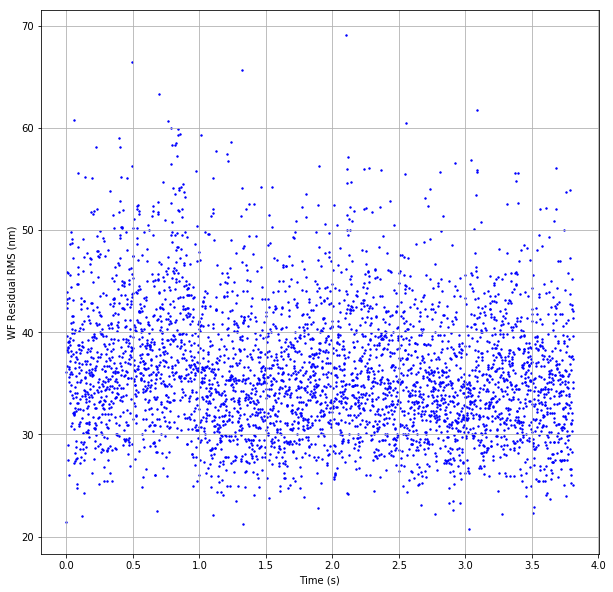

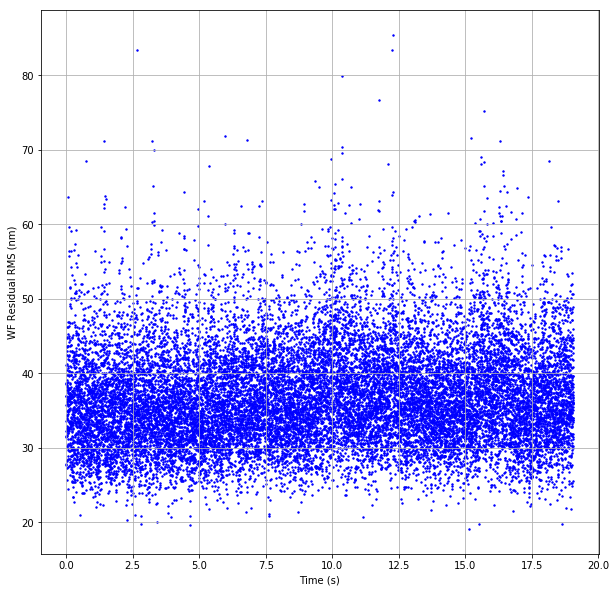

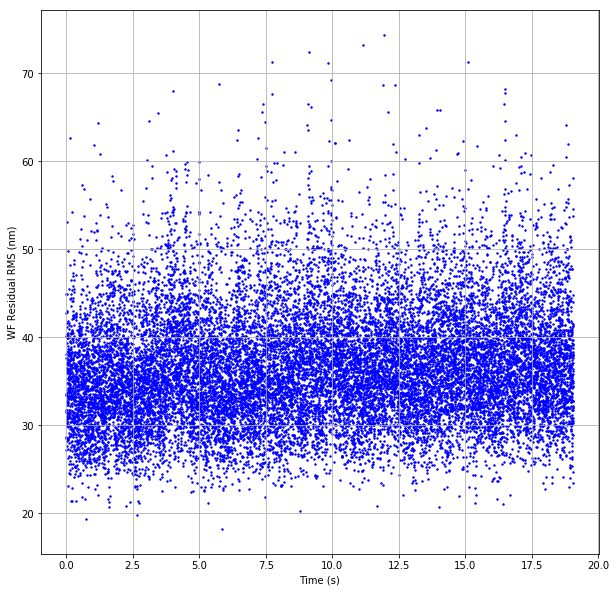

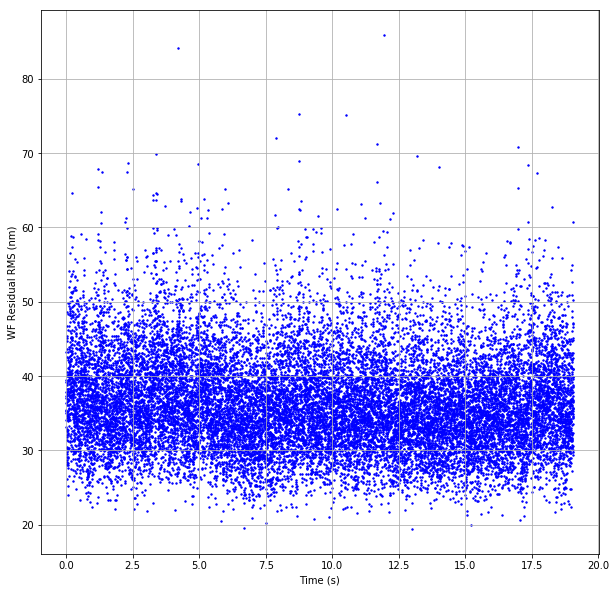

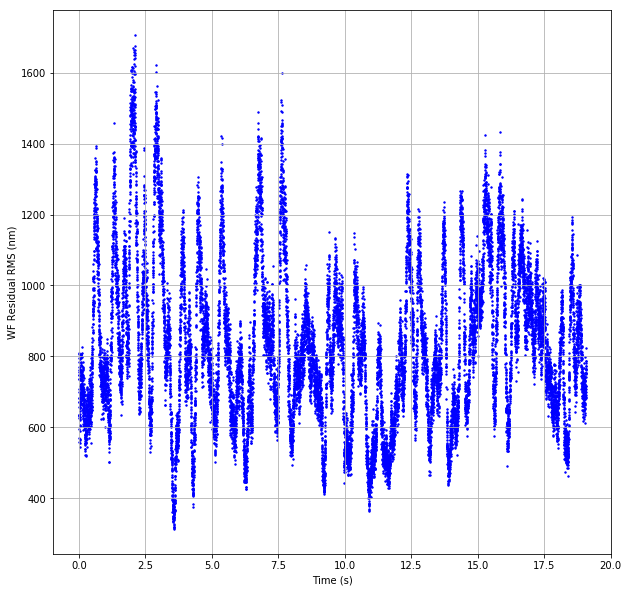

...

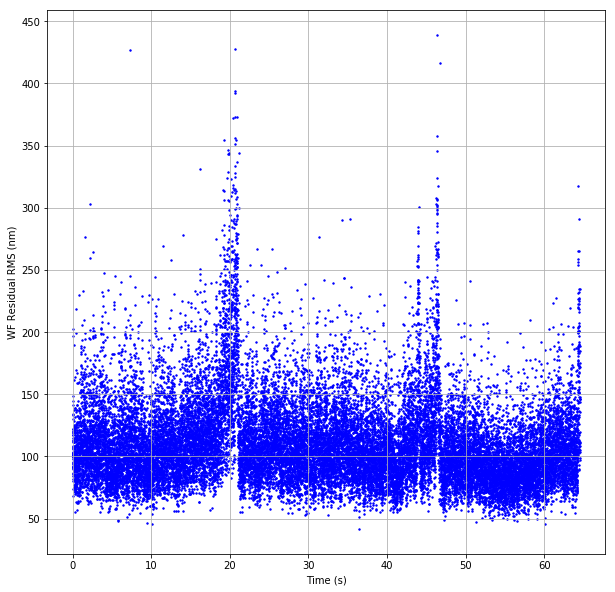

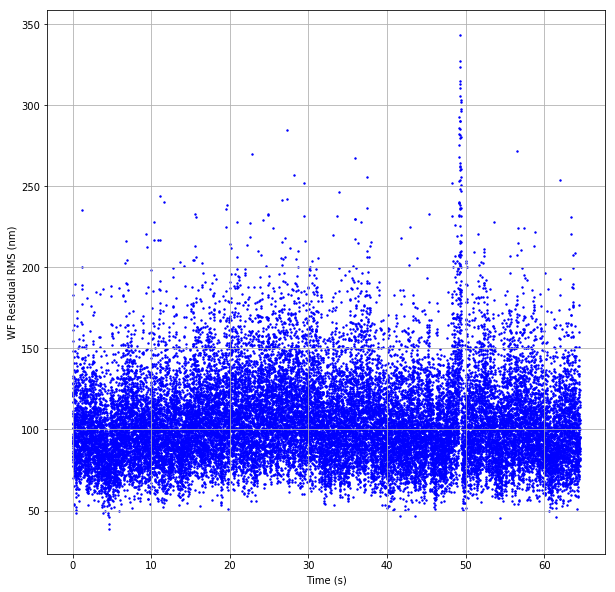

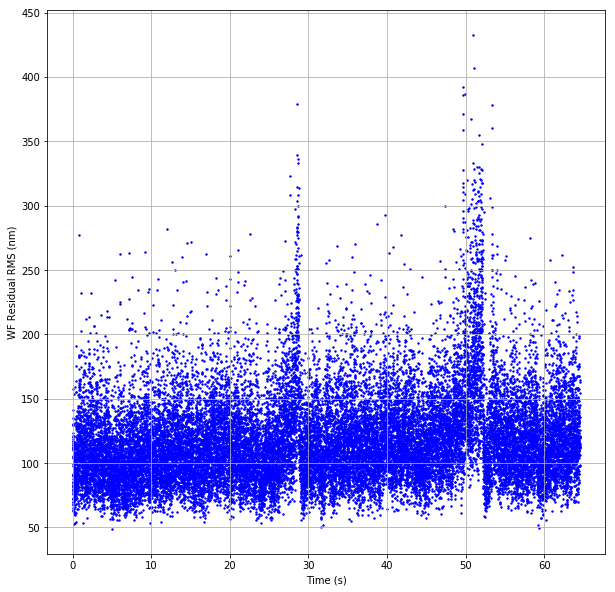

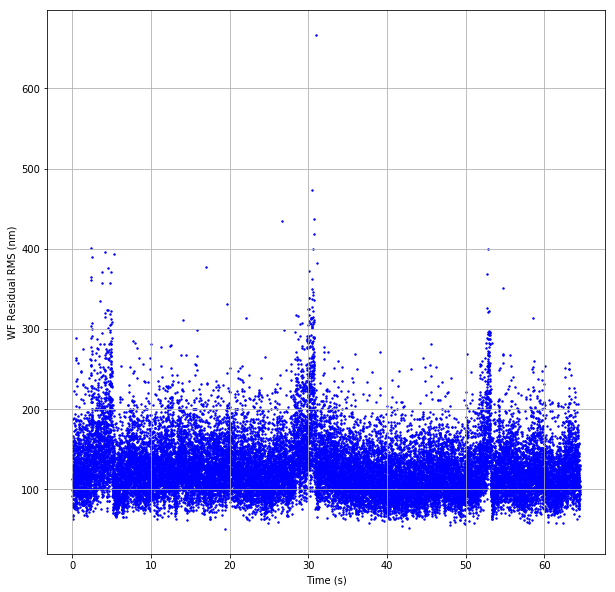

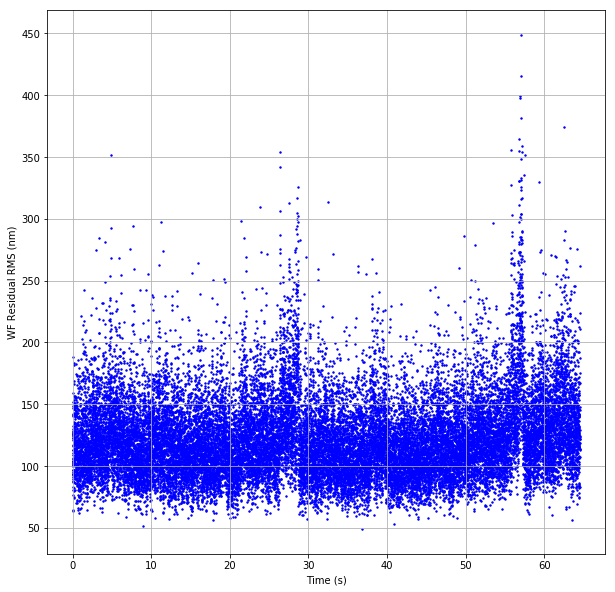

In [ ]:
for i in repeat:
    data = readsav(i)
    t, t_be = time(data)
    residualrms(t, data, i)

In [74]:
def time(data_extracted):
    time = (data_extracted.a.timestamp[0]-data_extracted.a.timestamp[0][0])/10000000
    time_begin = np.arange(0, time[len(time) - 1], 0.1)
    return time, time_begin

In [ ]:
i = 0
while i < 608:
    mx = data.a.offsetcentroid[0][:, i].mean()
    my = data.a.offsetcentroid[0][:, i + 1].mean()
    std1 = sqrt((data.a.offsetcentroid[0][:, i].std())**2 + (data.a.offsetcentroid[0][:, i + 1].std())**2)
#fig = plt.figure()
    theta = np.linspace(0, 2 * pi, 100)
    x = np.cos(theta)*std1 + mx
    y = np.sin(theta)*std1 + my
    fig = plt.figure(figsize = (10, 10))
    offset = plt.scatter(data.a.offsetcentroid[0][:,i], data.a.offsetcentroid[0][:,i + 1], s = 3, c = 'b')
    mean = plt.scatter(mx, my, s = 30, c = 'r')
    circle = plt.scatter(x, y, s = 10, c = 'k')
    plt.xlabel('Offset_x_' + str(i/2) + '(arcsec)')
    plt.ylabel('Offset_x_' + str(i/2) + '(arcsec)')
    plt.legend([circle, offset, mean], ['Circle (radius = offset_std)', 'Offset_Coordinate', 'Mean'], loc = 'lower right')
    #plt.xlim(-0.45,0.45)
    #plt.ylim(-0.45,0.45)
    plt.grid()
    plt.show()
    fig.savefig('offset_graphs/offset_' + str(i//2) + '.png')
    i += 2


In [76]:
def residualrms(time, data_extracted, file):
    t_new = [time[x] for x in range(len(time)) if x % 2 == 0]
    d = [list(data_extracted.a.residualrms[0][0])[x] for x in range(len(time)) if x % 4 ==0]
    fig = plt.figure(figsize = (10, 10))
    plt.scatter(time, data_extracted.a.residualrms[0][0], c = 'b', s = 2)
    plt.xlabel('Time (s)')
    plt.ylabel('WF Residual RMS (nm)')
    plt.grid()
    plt.show()
    fig.savefig('residualrms_plot/20150402/WFResidual_' + file.split('/')[6] + "_" + file.split('/')[10] + '.png')